**SegResNet, FedProx, ISLES'24**

In [39]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [40]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [41]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [42]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "E:/FYP/ISLES24 Split Preprocessed"
print(data_dir)

E:/FYP/ISLES24 Split Preprocessed


In [43]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "E:/FYP/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "E:/FYP/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: E:/FYP/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: E:/FYP/SegResNet/Federated_SegResNet_logs


In [44]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [45]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [46]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [47]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [48]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


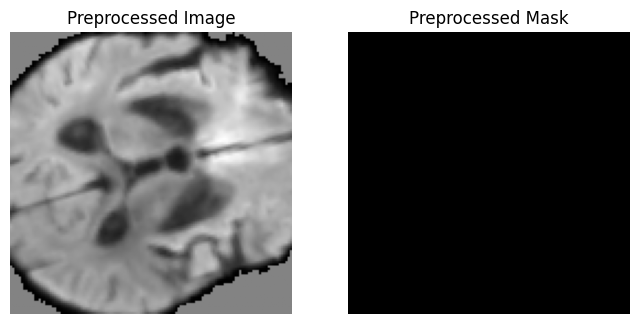

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


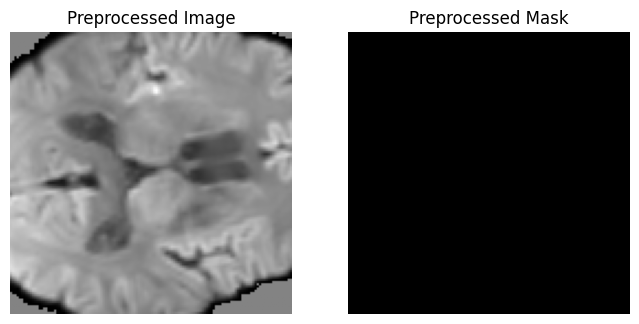


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


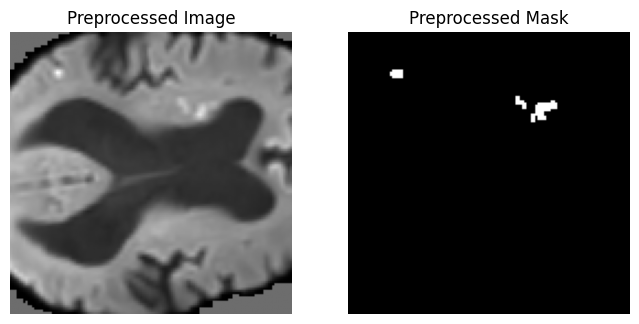

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


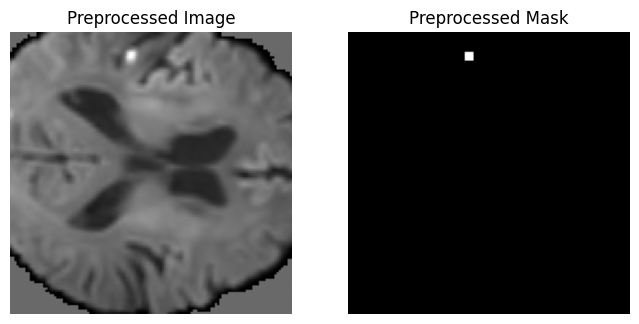


Client 1 dataset size: 50


In [49]:

original_root = "E:/FYP/ISLES24 Split"
processed_root = "E:/FYP/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    # orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    # orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    # dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    # mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    # print("\n🔵 RAW SAMPLES")
    # for idx in sample_indices:

    #     img = nib.load(dwi_files[idx]).get_fdata()
    #     mask = nib.load(mask_files[idx]).get_fdata()

    #     print(
    #         f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
    #         f"Mask values: {torch.unique(torch.tensor(mask))}"
    #     )

    #     mid = img.shape[2] // 2

    #     plt.figure(figsize=(8,4))
    #     plt.subplot(1,2,1)
    #     plt.imshow(img[:,:,mid], cmap="gray")
    #     plt.title("Raw Image")
    #     plt.axis("off")

    #     plt.subplot(1,2,2)
    #     plt.imshow(mask[:,:,mid], cmap="gray")
    #     plt.title("Raw Mask")
    #     plt.axis("off")
    #     plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [50]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [51]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [52]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [53]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [54]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [55]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [56]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [57]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8111 | Dice: 0.2309 | IoU: 0.1305 | HD95: 79.7840


Client 0 | Epoch 2/20 | Loss: 0.7783 | Dice: 0.2834 | IoU: 0.1651 | HD95: 76.6700


Client 0 | Epoch 3/20 | Loss: 0.7699 | Dice: 0.3140 | IoU: 0.1862 | HD95: 74.9499


Client 0 | Epoch 4/20 | Loss: 0.7670 | Dice: 0.2928 | IoU: 0.1715 | HD95: 74.5242


Client 0 | Epoch 5/20 | Loss: 0.7579 | Dice: 0.3260 | IoU: 0.1948 | HD95: 70.6025


Client 0 | Epoch 6/20 | Loss: 0.7510 | Dice: 0.3541 | IoU: 0.2151 | HD95: 67.2744


Client 0 | Epoch 7/20 | Loss: 0.7501 | Dice: 0.3598 | IoU: 0.2194 | HD95: 72.7779


Client 0 | Epoch 8/20 | Loss: 0.7418 | Dice: 0.3616 | IoU: 0.2207 | HD95: 66.0071


Client 0 | Epoch 9/20 | Loss: 0.7377 | Dice: 0.4027 | IoU: 0.2521 | HD95: 64.9778


Client 0 | Epoch 10/20 | Loss: 0.7331 | Dice: 0.3876 | IoU: 0.2404 | HD95: 65.1053


Client 0 | Epoch 11/20 | Loss: 0.7270 | Dice: 0.4058 | IoU: 0.2546 | HD95: 60.2603


Client 0 | Epoch 12/20 | Loss: 0.7180 | Dice: 0.4531 | IoU: 0.2929 | HD95: 58.9327


Client 0 | Epoch 13/20 | Loss: 0.7111 | Dice: 0.4496 | IoU: 0.2900 | HD95: 55.0548


Client 0 | Epoch 14/20 | Loss: 0.7060 | Dice: 0.4704 | IoU: 0.3075 | HD95: 57.2560


Client 0 | Epoch 15/20 | Loss: 0.7029 | Dice: 0.4498 | IoU: 0.2901 | HD95: 55.5644


Client 0 | Epoch 16/20 | Loss: 0.7022 | Dice: 0.4329 | IoU: 0.2762 | HD95: 59.3585


Client 0 | Epoch 17/20 | Loss: 0.6956 | Dice: 0.4396 | IoU: 0.2817 | HD95: 52.5741


Client 0 | Epoch 18/20 | Loss: 0.6898 | Dice: 0.4589 | IoU: 0.2978 | HD95: 52.5065


Client 0 | Epoch 19/20 | Loss: 0.6937 | Dice: 0.4065 | IoU: 0.2551 | HD95: 60.3913


Clients Training:  50%|█████     | 1/2 [08:32<08:32, 512.71s/it]

Client 0 | Epoch 20/20 | Loss: 0.6794 | Dice: 0.4890 | IoU: 0.3236 | HD95: 51.2273
Client 0 | Loss=0.7312 | Dice=0.4890 | IoU=0.3236 | HD95=51.2273


Client 1 | Epoch 1/20 | Loss: 0.8200 | Dice: 0.1617 | IoU: 0.0880 | HD95: 75.6937


Client 1 | Epoch 2/20 | Loss: 0.7941 | Dice: 0.2407 | IoU: 0.1368 | HD95: 77.2413


Client 1 | Epoch 3/20 | Loss: 0.7839 | Dice: 0.2539 | IoU: 0.1454 | HD95: 76.2586


Client 1 | Epoch 4/20 | Loss: 0.7788 | Dice: 0.2552 | IoU: 0.1463 | HD95: 73.0675


Client 1 | Epoch 5/20 | Loss: 0.7723 | Dice: 0.2722 | IoU: 0.1575 | HD95: 74.3196


Client 1 | Epoch 6/20 | Loss: 0.7661 | Dice: 0.3056 | IoU: 0.1804 | HD95: 72.6389


Client 1 | Epoch 7/20 | Loss: 0.7591 | Dice: 0.3200 | IoU: 0.1905 | HD95: 67.2692


Client 1 | Epoch 8/20 | Loss: 0.7545 | Dice: 0.3346 | IoU: 0.2009 | HD95: 68.5449


Client 1 | Epoch 9/20 | Loss: 0.7488 | Dice: 0.3548 | IoU: 0.2157 | HD95: 66.4191


Client 1 | Epoch 10/20 | Loss: 0.7442 | Dice: 0.3678 | IoU: 0.2254 | HD95: 62.7165


Client 1 | Epoch 11/20 | Loss: 0.7448 | Dice: 0.3384 | IoU: 0.2037 | HD95: 67.9746


Client 1 | Epoch 12/20 | Loss: 0.7378 | Dice: 0.3398 | IoU: 0.2047 | HD95: 66.3652


Client 1 | Epoch 13/20 | Loss: 0.7292 | Dice: 0.3916 | IoU: 0.2434 | HD95: 60.5554


Client 1 | Epoch 14/20 | Loss: 0.7310 | Dice: 0.3467 | IoU: 0.2097 | HD95: 62.3312


Client 1 | Epoch 15/20 | Loss: 0.7215 | Dice: 0.4001 | IoU: 0.2500 | HD95: 58.8826


Client 1 | Epoch 16/20 | Loss: 0.7203 | Dice: 0.3832 | IoU: 0.2370 | HD95: 60.9911


Client 1 | Epoch 17/20 | Loss: 0.7108 | Dice: 0.4161 | IoU: 0.2627 | HD95: 54.6042


Client 1 | Epoch 18/20 | Loss: 0.7064 | Dice: 0.4244 | IoU: 0.2693 | HD95: 52.2130


Client 1 | Epoch 19/20 | Loss: 0.7089 | Dice: 0.3729 | IoU: 0.2292 | HD95: 58.7370


Client 1 Epochs: 100%|██████████| 20/20 [08:24<00:00, 25.20s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.7017 | Dice: 0.4116 | IoU: 0.2591 | HD95: 58.5604
Client 1 | Loss=0.7467 | Dice=0.4116 | IoU=0.2591 | HD95=58.5604


Best global model updated with Dice=0.4425
Global | Val Loss=0.6498 | Dice=0.4425 | IoU=0.2841 | HD95=46.1081
Checkpoint saved for round 1 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6762 | Dice: 0.4016 | IoU: 0.2512 | HD95: 58.3449


Client 0 | Epoch 2/20 | Loss: 0.6704 | Dice: 0.4411 | IoU: 0.2829 | HD95: 58.9813


Client 0 | Epoch 3/20 | Loss: 0.6686 | Dice: 0.4188 | IoU: 0.2649 | HD95: 56.6280


Client 0 | Epoch 4/20 | Loss: 0.6587 | Dice: 0.4512 | IoU: 0.2913 | HD95: 53.5279


Client 0 | Epoch 5/20 | Loss: 0.6448 | Dice: 0.4903 | IoU: 0.3247 | HD95: 48.7774


Client 0 | Epoch 6/20 | Loss: 0.6398 | Dice: 0.5259 | IoU: 0.3568 | HD95: 44.5688


Client 0 | Epoch 7/20 | Loss: 0.6350 | Dice: 0.4987 | IoU: 0.3322 | HD95: 50.1482


Client 0 | Epoch 8/20 | Loss: 0.6438 | Dice: 0.4485 | IoU: 0.2891 | HD95: 55.4604


Client 0 | Epoch 9/20 | Loss: 0.6288 | Dice: 0.4718 | IoU: 0.3087 | HD95: 49.9080


Client 0 | Epoch 10/20 | Loss: 0.6235 | Dice: 0.4942 | IoU: 0.3282 | HD95: 51.5281


Client 0 | Epoch 11/20 | Loss: 0.6164 | Dice: 0.5123 | IoU: 0.3443 | HD95: 46.2984


Client 0 | Epoch 12/20 | Loss: 0.6085 | Dice: 0.5490 | IoU: 0.3784 | HD95: 38.8277


Client 0 | Epoch 13/20 | Loss: 0.6025 | Dice: 0.5373 | IoU: 0.3673 | HD95: 44.7060


Client 0 | Epoch 14/20 | Loss: 0.6068 | Dice: 0.4991 | IoU: 0.3325 | HD95: 52.6557


Client 0 | Epoch 15/20 | Loss: 0.5929 | Dice: 0.5469 | IoU: 0.3763 | HD95: 47.2622


Client 0 | Epoch 16/20 | Loss: 0.5883 | Dice: 0.5427 | IoU: 0.3724 | HD95: 44.4113


Client 0 | Epoch 17/20 | Loss: 0.5824 | Dice: 0.5488 | IoU: 0.3781 | HD95: 39.7786


Client 0 | Epoch 18/20 | Loss: 0.5729 | Dice: 0.5727 | IoU: 0.4012 | HD95: 39.4059


Client 0 | Epoch 19/20 | Loss: 0.5707 | Dice: 0.5643 | IoU: 0.3931 | HD95: 42.4297


Clients Training:  50%|█████     | 1/2 [07:53<07:53, 473.84s/it]

Client 0 | Epoch 20/20 | Loss: 0.5649 | Dice: 0.5680 | IoU: 0.3967 | HD95: 39.0260
Client 0 | Loss=0.6198 | Dice=0.5680 | IoU=0.3967 | HD95=39.0260


Client 1 | Epoch 1/20 | Loss: 0.7003 | Dice: 0.3620 | IoU: 0.2210 | HD95: 63.6524


Client 1 | Epoch 2/20 | Loss: 0.6937 | Dice: 0.4096 | IoU: 0.2576 | HD95: 55.3510


Client 1 | Epoch 3/20 | Loss: 0.6843 | Dice: 0.4345 | IoU: 0.2775 | HD95: 54.8724


Client 1 | Epoch 4/20 | Loss: 0.6792 | Dice: 0.4277 | IoU: 0.2721 | HD95: 52.3314


Client 1 | Epoch 5/20 | Loss: 0.6685 | Dice: 0.4663 | IoU: 0.3040 | HD95: 47.9500


Client 1 | Epoch 6/20 | Loss: 0.6713 | Dice: 0.4484 | IoU: 0.2890 | HD95: 52.6485


Client 1 | Epoch 7/20 | Loss: 0.6743 | Dice: 0.3739 | IoU: 0.2299 | HD95: 64.3894


Client 1 | Epoch 8/20 | Loss: 0.6617 | Dice: 0.4331 | IoU: 0.2764 | HD95: 56.2564


Client 1 | Epoch 9/20 | Loss: 0.6578 | Dice: 0.4476 | IoU: 0.2883 | HD95: 50.6225


Client 1 | Epoch 10/20 | Loss: 0.6528 | Dice: 0.4191 | IoU: 0.2651 | HD95: 54.8682


Client 1 | Epoch 11/20 | Loss: 0.6428 | Dice: 0.4710 | IoU: 0.3081 | HD95: 46.0520


Client 1 | Epoch 12/20 | Loss: 0.6350 | Dice: 0.4902 | IoU: 0.3247 | HD95: 44.7956


Client 1 | Epoch 13/20 | Loss: 0.6310 | Dice: 0.4990 | IoU: 0.3325 | HD95: 45.4035


Client 1 | Epoch 14/20 | Loss: 0.6340 | Dice: 0.4630 | IoU: 0.3012 | HD95: 47.4415


Client 1 | Epoch 15/20 | Loss: 0.6188 | Dice: 0.5240 | IoU: 0.3550 | HD95: 41.6936


Client 1 | Epoch 16/20 | Loss: 0.6227 | Dice: 0.4687 | IoU: 0.3061 | HD95: 46.4453


Client 1 | Epoch 17/20 | Loss: 0.6085 | Dice: 0.5141 | IoU: 0.3460 | HD95: 38.0138


Client 1 | Epoch 18/20 | Loss: 0.6099 | Dice: 0.4808 | IoU: 0.3165 | HD95: 50.5189


Client 1 | Epoch 19/20 | Loss: 0.5977 | Dice: 0.5444 | IoU: 0.3740 | HD95: 39.0188


Client 1 Epochs: 100%|██████████| 20/20 [07:58<00:00, 23.92s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.5939 | Dice: 0.5364 | IoU: 0.3665 | HD95: 37.3565
Client 1 | Loss=0.6469 | Dice=0.5364 | IoU=0.3665 | HD95=37.3565


Best global model updated with Dice=0.4805
Global | Val Loss=0.5462 | Dice=0.4805 | IoU=0.3162 | HD95=44.1821
Checkpoint saved for round 2 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5541 | Dice: 0.5676 | IoU: 0.3963 | HD95: 37.6108


Client 0 | Epoch 2/20 | Loss: 0.5454 | Dice: 0.5876 | IoU: 0.4161 | HD95: 40.2269


Client 0 | Epoch 3/20 | Loss: 0.5466 | Dice: 0.5655 | IoU: 0.3943 | HD95: 42.7741


Client 0 | Epoch 4/20 | Loss: 0.5389 | Dice: 0.5590 | IoU: 0.3880 | HD95: 41.6024


Client 0 | Epoch 5/20 | Loss: 0.5361 | Dice: 0.5672 | IoU: 0.3959 | HD95: 36.1781


Client 0 | Epoch 6/20 | Loss: 0.5378 | Dice: 0.5353 | IoU: 0.3655 | HD95: 42.2220


Client 0 | Epoch 7/20 | Loss: 0.5408 | Dice: 0.5284 | IoU: 0.3591 | HD95: 46.6777


Client 0 | Epoch 8/20 | Loss: 0.5178 | Dice: 0.5942 | IoU: 0.4227 | HD95: 40.2252


Client 0 | Epoch 9/20 | Loss: 0.5108 | Dice: 0.5836 | IoU: 0.4120 | HD95: 39.6926


Client 0 | Epoch 10/20 | Loss: 0.5051 | Dice: 0.6023 | IoU: 0.4309 | HD95: 39.4314


Client 0 | Epoch 11/20 | Loss: 0.4981 | Dice: 0.5865 | IoU: 0.4150 | HD95: 37.8568


Client 0 | Epoch 12/20 | Loss: 0.5083 | Dice: 0.5502 | IoU: 0.3795 | HD95: 45.5343


Client 0 | Epoch 13/20 | Loss: 0.4925 | Dice: 0.6059 | IoU: 0.4346 | HD95: 33.9116


Client 0 | Epoch 14/20 | Loss: 0.4821 | Dice: 0.6010 | IoU: 0.4296 | HD95: 36.4328


Client 0 | Epoch 15/20 | Loss: 0.4706 | Dice: 0.6263 | IoU: 0.4560 | HD95: 32.2951


Client 0 | Epoch 16/20 | Loss: 0.4606 | Dice: 0.6456 | IoU: 0.4767 | HD95: 25.9260


Client 0 | Epoch 17/20 | Loss: 0.4779 | Dice: 0.5888 | IoU: 0.4172 | HD95: 39.9801


Client 0 | Epoch 18/20 | Loss: 0.4559 | Dice: 0.6448 | IoU: 0.4758 | HD95: 27.5718


Client 0 | Epoch 19/20 | Loss: 0.4424 | Dice: 0.6532 | IoU: 0.4850 | HD95: 28.4825


Clients Training:  50%|█████     | 1/2 [07:24<07:24, 444.52s/it]

Client 0 | Epoch 20/20 | Loss: 0.4400 | Dice: 0.6390 | IoU: 0.4695 | HD95: 32.1336
Client 0 | Loss=0.5031 | Dice=0.6390 | IoU=0.4695 | HD95=32.1336


Client 1 | Epoch 1/20 | Loss: 0.5834 | Dice: 0.5341 | IoU: 0.3644 | HD95: 42.9882


Client 1 | Epoch 2/20 | Loss: 0.5739 | Dice: 0.5659 | IoU: 0.3946 | HD95: 35.9042


Client 1 | Epoch 3/20 | Loss: 0.5662 | Dice: 0.5600 | IoU: 0.3889 | HD95: 34.6132


Client 1 | Epoch 4/20 | Loss: 0.5758 | Dice: 0.5236 | IoU: 0.3546 | HD95: 45.5040


Client 1 | Epoch 5/20 | Loss: 0.5760 | Dice: 0.5169 | IoU: 0.3485 | HD95: 45.9396


Client 1 | Epoch 6/20 | Loss: 0.5573 | Dice: 0.5565 | IoU: 0.3855 | HD95: 40.7003


Client 1 | Epoch 7/20 | Loss: 0.5520 | Dice: 0.5607 | IoU: 0.3896 | HD95: 37.0501


Client 1 | Epoch 8/20 | Loss: 0.5365 | Dice: 0.6012 | IoU: 0.4298 | HD95: 33.1420


Client 1 | Epoch 9/20 | Loss: 0.5354 | Dice: 0.5797 | IoU: 0.4082 | HD95: 34.0010


Client 1 | Epoch 10/20 | Loss: 0.5295 | Dice: 0.5825 | IoU: 0.4110 | HD95: 36.5728


Client 1 | Epoch 11/20 | Loss: 0.5193 | Dice: 0.5980 | IoU: 0.4265 | HD95: 27.3326


Client 1 | Epoch 12/20 | Loss: 0.5043 | Dice: 0.6225 | IoU: 0.4519 | HD95: 28.3276


Client 1 | Epoch 13/20 | Loss: 0.5049 | Dice: 0.5954 | IoU: 0.4239 | HD95: 33.8554


Client 1 | Epoch 14/20 | Loss: 0.4959 | Dice: 0.6113 | IoU: 0.4402 | HD95: 28.1652


Client 1 | Epoch 15/20 | Loss: 0.4846 | Dice: 0.6313 | IoU: 0.4613 | HD95: 26.9546


Client 1 | Epoch 16/20 | Loss: 0.4777 | Dice: 0.6398 | IoU: 0.4703 | HD95: 27.3534


Client 1 | Epoch 17/20 | Loss: 0.5106 | Dice: 0.5416 | IoU: 0.3714 | HD95: 43.0886


Client 1 | Epoch 18/20 | Loss: 0.4857 | Dice: 0.5998 | IoU: 0.4284 | HD95: 37.5302


Client 1 | Epoch 19/20 | Loss: 0.4723 | Dice: 0.6062 | IoU: 0.4349 | HD95: 30.9760


Client 1 Epochs: 100%|██████████| 20/20 [07:26<00:00, 22.33s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.4572 | Dice: 0.6493 | IoU: 0.4807 | HD95: 23.7451
Client 1 | Loss=0.5249 | Dice=0.6493 | IoU=0.4807 | HD95=23.7451


Best global model updated with Dice=0.6376
Global | Val Loss=0.4164 | Dice=0.6376 | IoU=0.4681 | HD95=15.7890
Checkpoint saved for round 3 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4213 | Dice: 0.6407 | IoU: 0.4713 | HD95: 33.5653


Client 0 | Epoch 2/20 | Loss: 0.4173 | Dice: 0.6493 | IoU: 0.4808 | HD95: 29.8949


Client 0 | Epoch 3/20 | Loss: 0.4143 | Dice: 0.6596 | IoU: 0.4921 | HD95: 27.2698


Client 0 | Epoch 4/20 | Loss: 0.4036 | Dice: 0.6668 | IoU: 0.5001 | HD95: 25.0607


Client 0 | Epoch 5/20 | Loss: 0.4185 | Dice: 0.6158 | IoU: 0.4449 | HD95: 33.5245


Client 0 | Epoch 6/20 | Loss: 0.3962 | Dice: 0.6651 | IoU: 0.4982 | HD95: 24.8876


Client 0 | Epoch 7/20 | Loss: 0.3916 | Dice: 0.6655 | IoU: 0.4987 | HD95: 28.6629


Client 0 | Epoch 8/20 | Loss: 0.3814 | Dice: 0.6730 | IoU: 0.5072 | HD95: 27.6751


Client 0 | Epoch 9/20 | Loss: 0.4017 | Dice: 0.6182 | IoU: 0.4474 | HD95: 34.6233


Client 0 | Epoch 10/20 | Loss: 0.3814 | Dice: 0.6767 | IoU: 0.5114 | HD95: 24.4440


Client 0 | Epoch 11/20 | Loss: 0.3686 | Dice: 0.6802 | IoU: 0.5154 | HD95: 22.9862


Client 0 | Epoch 12/20 | Loss: 0.3707 | Dice: 0.6746 | IoU: 0.5089 | HD95: 23.2515


Client 0 | Epoch 13/20 | Loss: 0.3639 | Dice: 0.6603 | IoU: 0.4928 | HD95: 26.1928


Client 0 | Epoch 14/20 | Loss: 0.3532 | Dice: 0.6842 | IoU: 0.5200 | HD95: 25.5557


Client 0 | Epoch 15/20 | Loss: 0.3418 | Dice: 0.7040 | IoU: 0.5432 | HD95: 20.6642


Client 0 | Epoch 16/20 | Loss: 0.3374 | Dice: 0.7006 | IoU: 0.5392 | HD95: 21.4116


Client 0 | Epoch 17/20 | Loss: 0.3362 | Dice: 0.6957 | IoU: 0.5334 | HD95: 23.2223


Client 0 | Epoch 18/20 | Loss: 0.3459 | Dice: 0.6658 | IoU: 0.4990 | HD95: 30.3004


Client 0 | Epoch 19/20 | Loss: 0.3416 | Dice: 0.6727 | IoU: 0.5068 | HD95: 26.6833


Clients Training:  50%|█████     | 1/2 [06:55<06:55, 415.19s/it]

Client 0 | Epoch 20/20 | Loss: 0.3250 | Dice: 0.6997 | IoU: 0.5381 | HD95: 16.7227
Client 0 | Loss=0.3756 | Dice=0.6997 | IoU=0.5381 | HD95=16.7227


Client 1 | Epoch 1/20 | Loss: 0.4584 | Dice: 0.6177 | IoU: 0.4468 | HD95: 28.7710


Client 1 | Epoch 2/20 | Loss: 0.4475 | Dice: 0.6387 | IoU: 0.4692 | HD95: 23.8103


Client 1 | Epoch 3/20 | Loss: 0.4379 | Dice: 0.6437 | IoU: 0.4746 | HD95: 25.6360


Client 1 | Epoch 4/20 | Loss: 0.4204 | Dice: 0.6752 | IoU: 0.5096 | HD95: 21.9787


Client 1 | Epoch 5/20 | Loss: 0.4406 | Dice: 0.6265 | IoU: 0.4561 | HD95: 28.7728


Client 1 | Epoch 6/20 | Loss: 0.4280 | Dice: 0.6358 | IoU: 0.4661 | HD95: 30.5034


Client 1 | Epoch 7/20 | Loss: 0.4137 | Dice: 0.6533 | IoU: 0.4851 | HD95: 26.1676


Client 1 | Epoch 8/20 | Loss: 0.4039 | Dice: 0.6649 | IoU: 0.4981 | HD95: 22.1624


Client 1 | Epoch 9/20 | Loss: 0.3950 | Dice: 0.6769 | IoU: 0.5116 | HD95: 24.9458


Client 1 | Epoch 10/20 | Loss: 0.3836 | Dice: 0.6916 | IoU: 0.5286 | HD95: 17.8063


Client 1 | Epoch 11/20 | Loss: 0.3849 | Dice: 0.6730 | IoU: 0.5071 | HD95: 27.1092


Client 1 | Epoch 12/20 | Loss: 0.3878 | Dice: 0.6524 | IoU: 0.4841 | HD95: 25.8160


Client 1 | Epoch 13/20 | Loss: 0.3746 | Dice: 0.6790 | IoU: 0.5140 | HD95: 24.2061


Client 1 | Epoch 14/20 | Loss: 0.3742 | Dice: 0.6757 | IoU: 0.5102 | HD95: 22.1285


Client 1 | Epoch 15/20 | Loss: 0.3505 | Dice: 0.7060 | IoU: 0.5456 | HD95: 17.1483


Client 1 | Epoch 16/20 | Loss: 0.3409 | Dice: 0.7151 | IoU: 0.5566 | HD95: 18.5393


Client 1 | Epoch 17/20 | Loss: 0.3370 | Dice: 0.7128 | IoU: 0.5538 | HD95: 17.6467


Client 1 | Epoch 18/20 | Loss: 0.3433 | Dice: 0.6926 | IoU: 0.5298 | HD95: 21.0857


Client 1 | Epoch 19/20 | Loss: 0.3329 | Dice: 0.7130 | IoU: 0.5540 | HD95: 19.7429


Client 1 Epochs: 100%|██████████| 20/20 [07:03<00:00, 21.19s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.3202 | Dice: 0.7192 | IoU: 0.5615 | HD95: 12.2105
Client 1 | Loss=0.3888 | Dice=0.7192 | IoU=0.5615 | HD95=12.2105


Best global model updated with Dice=0.6693
Global | Val Loss=0.3246 | Dice=0.6693 | IoU=0.5030 | HD95=15.8548
Checkpoint saved for round 4 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3201 | Dice: 0.6864 | IoU: 0.5226 | HD95: 25.2676


Client 0 | Epoch 2/20 | Loss: 0.3124 | Dice: 0.6917 | IoU: 0.5287 | HD95: 22.3694


Client 0 | Epoch 3/20 | Loss: 0.3022 | Dice: 0.7084 | IoU: 0.5485 | HD95: 21.0602


Client 0 | Epoch 4/20 | Loss: 0.3077 | Dice: 0.6915 | IoU: 0.5285 | HD95: 26.6266


Client 0 | Epoch 5/20 | Loss: 0.3024 | Dice: 0.7011 | IoU: 0.5397 | HD95: 19.2110


Client 0 | Epoch 6/20 | Loss: 0.2903 | Dice: 0.7232 | IoU: 0.5664 | HD95: 20.3665


Client 0 | Epoch 7/20 | Loss: 0.2850 | Dice: 0.7192 | IoU: 0.5616 | HD95: 18.9514


Client 0 | Epoch 8/20 | Loss: 0.2887 | Dice: 0.7065 | IoU: 0.5461 | HD95: 22.5928


Client 0 | Epoch 9/20 | Loss: 0.3071 | Dice: 0.6671 | IoU: 0.5005 | HD95: 24.1614


Client 0 | Epoch 10/20 | Loss: 0.3274 | Dice: 0.6437 | IoU: 0.4746 | HD95: 27.8518


Client 0 | Epoch 11/20 | Loss: 0.3092 | Dice: 0.6803 | IoU: 0.5155 | HD95: 23.2731


Client 0 | Epoch 12/20 | Loss: 0.2914 | Dice: 0.7029 | IoU: 0.5419 | HD95: 23.3050


Client 0 | Epoch 13/20 | Loss: 0.2710 | Dice: 0.7311 | IoU: 0.5762 | HD95: 15.4514


Client 0 | Epoch 14/20 | Loss: 0.2798 | Dice: 0.7159 | IoU: 0.5575 | HD95: 22.4136


Client 0 | Epoch 15/20 | Loss: 0.2794 | Dice: 0.7018 | IoU: 0.5406 | HD95: 22.1690


Client 0 | Epoch 16/20 | Loss: 0.2834 | Dice: 0.6948 | IoU: 0.5323 | HD95: 21.6469


Client 0 | Epoch 17/20 | Loss: 0.2813 | Dice: 0.6955 | IoU: 0.5331 | HD95: 23.8612


Client 0 | Epoch 18/20 | Loss: 0.2687 | Dice: 0.7164 | IoU: 0.5581 | HD95: 18.1020


Client 0 | Epoch 19/20 | Loss: 0.2609 | Dice: 0.7260 | IoU: 0.5699 | HD95: 18.7469


Clients Training:  50%|█████     | 1/2 [06:45<06:45, 405.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.2538 | Dice: 0.7330 | IoU: 0.5785 | HD95: 17.2589
Client 0 | Loss=0.2911 | Dice=0.7330 | IoU=0.5785 | HD95=17.2589


Client 1 | Epoch 1/20 | Loss: 0.3214 | Dice: 0.7126 | IoU: 0.5535 | HD95: 17.8503


Client 1 | Epoch 2/20 | Loss: 0.3229 | Dice: 0.7002 | IoU: 0.5387 | HD95: 19.1574


Client 1 | Epoch 3/20 | Loss: 0.3105 | Dice: 0.7147 | IoU: 0.5561 | HD95: 16.8425


Client 1 | Epoch 4/20 | Loss: 0.3264 | Dice: 0.6847 | IoU: 0.5206 | HD95: 21.3140


Client 1 | Epoch 5/20 | Loss: 0.2974 | Dice: 0.7298 | IoU: 0.5745 | HD95: 13.7947


Client 1 | Epoch 6/20 | Loss: 0.3010 | Dice: 0.7135 | IoU: 0.5546 | HD95: 16.5269


Client 1 | Epoch 7/20 | Loss: 0.2962 | Dice: 0.7215 | IoU: 0.5643 | HD95: 14.4732


Client 1 | Epoch 8/20 | Loss: 0.2930 | Dice: 0.7230 | IoU: 0.5662 | HD95: 18.4665


Client 1 | Epoch 9/20 | Loss: 0.2806 | Dice: 0.7345 | IoU: 0.5805 | HD95: 14.5774


Client 1 | Epoch 10/20 | Loss: 0.2733 | Dice: 0.7476 | IoU: 0.5969 | HD95: 12.7818


Client 1 | Epoch 11/20 | Loss: 0.2873 | Dice: 0.7194 | IoU: 0.5618 | HD95: 16.8804


Client 1 | Epoch 12/20 | Loss: 0.3255 | Dice: 0.6600 | IoU: 0.4926 | HD95: 26.1472


Client 1 | Epoch 13/20 | Loss: 0.3098 | Dice: 0.6890 | IoU: 0.5255 | HD95: 20.3059


Client 1 | Epoch 14/20 | Loss: 0.2820 | Dice: 0.7239 | IoU: 0.5673 | HD95: 14.1554


Client 1 | Epoch 15/20 | Loss: 0.2773 | Dice: 0.7255 | IoU: 0.5692 | HD95: 16.9450


Client 1 | Epoch 16/20 | Loss: 0.2647 | Dice: 0.7436 | IoU: 0.5918 | HD95: 11.3834


Client 1 | Epoch 17/20 | Loss: 0.2652 | Dice: 0.7360 | IoU: 0.5823 | HD95: 14.1543


Client 1 | Epoch 18/20 | Loss: 0.2576 | Dice: 0.7469 | IoU: 0.5961 | HD95: 10.7137


Client 1 | Epoch 19/20 | Loss: 0.2571 | Dice: 0.7452 | IoU: 0.5939 | HD95: 10.4801


Client 1 Epochs: 100%|██████████| 20/20 [06:52<00:00, 20.61s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2576 | Dice: 0.7393 | IoU: 0.5865 | HD95: 15.2570
Client 1 | Loss=0.2903 | Dice=0.7393 | IoU=0.5865 | HD95=15.2570


Best global model updated with Dice=0.6818
Global | Val Loss=0.2671 | Dice=0.6818 | IoU=0.5172 | HD95=11.2785
Checkpoint saved for round 5 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2667 | Dice: 0.7002 | IoU: 0.5387 | HD95: 22.2658


Client 0 | Epoch 2/20 | Loss: 0.2892 | Dice: 0.6906 | IoU: 0.5274 | HD95: 24.5946


Client 0 | Epoch 3/20 | Loss: 0.2714 | Dice: 0.7045 | IoU: 0.5438 | HD95: 21.1741


Client 0 | Epoch 4/20 | Loss: 0.2740 | Dice: 0.6874 | IoU: 0.5237 | HD95: 19.8644


Client 0 | Epoch 5/20 | Loss: 0.2846 | Dice: 0.6752 | IoU: 0.5097 | HD95: 28.6978


Client 0 | Epoch 6/20 | Loss: 0.2606 | Dice: 0.7127 | IoU: 0.5536 | HD95: 21.1458


Client 0 | Epoch 7/20 | Loss: 0.2513 | Dice: 0.7280 | IoU: 0.5723 | HD95: 18.2472


Client 0 | Epoch 8/20 | Loss: 0.2632 | Dice: 0.7049 | IoU: 0.5442 | HD95: 19.8967


Client 0 | Epoch 9/20 | Loss: 0.2534 | Dice: 0.7208 | IoU: 0.5635 | HD95: 19.9726


Client 0 | Epoch 10/20 | Loss: 0.2399 | Dice: 0.7362 | IoU: 0.5825 | HD95: 18.7918


Client 0 | Epoch 11/20 | Loss: 0.2406 | Dice: 0.7354 | IoU: 0.5815 | HD95: 17.8913


Client 0 | Epoch 12/20 | Loss: 0.2302 | Dice: 0.7509 | IoU: 0.6012 | HD95: 16.2149


Client 0 | Epoch 13/20 | Loss: 0.2273 | Dice: 0.7520 | IoU: 0.6026 | HD95: 15.3364


Client 0 | Epoch 14/20 | Loss: 0.2333 | Dice: 0.7367 | IoU: 0.5832 | HD95: 18.4792


Client 0 | Epoch 15/20 | Loss: 0.2359 | Dice: 0.7382 | IoU: 0.5850 | HD95: 17.4507


Client 0 | Epoch 16/20 | Loss: 0.2324 | Dice: 0.7522 | IoU: 0.6029 | HD95: 15.7801


Client 0 | Epoch 17/20 | Loss: 0.2261 | Dice: 0.7532 | IoU: 0.6042 | HD95: 15.5905


Client 0 | Epoch 18/20 | Loss: 0.2292 | Dice: 0.7477 | IoU: 0.5970 | HD95: 14.2746


Client 0 | Epoch 19/20 | Loss: 0.2235 | Dice: 0.7549 | IoU: 0.6063 | HD95: 16.8427


Clients Training:  50%|█████     | 1/2 [06:44<06:44, 404.51s/it]

Client 0 | Epoch 20/20 | Loss: 0.2246 | Dice: 0.7513 | IoU: 0.6017 | HD95: 12.2293
Client 0 | Loss=0.2479 | Dice=0.7513 | IoU=0.6017 | HD95=12.2293


Client 1 | Epoch 1/20 | Loss: 0.2622 | Dice: 0.7201 | IoU: 0.5626 | HD95: 15.9386


Client 1 | Epoch 2/20 | Loss: 0.2697 | Dice: 0.7169 | IoU: 0.5587 | HD95: 17.9871


Client 1 | Epoch 3/20 | Loss: 0.2646 | Dice: 0.7244 | IoU: 0.5679 | HD95: 17.3505


Client 1 | Epoch 4/20 | Loss: 0.2598 | Dice: 0.7244 | IoU: 0.5679 | HD95: 15.6908


Client 1 | Epoch 5/20 | Loss: 0.2508 | Dice: 0.7357 | IoU: 0.5819 | HD95: 11.3029


Client 1 | Epoch 6/20 | Loss: 0.2551 | Dice: 0.7289 | IoU: 0.5734 | HD95: 13.3747


Client 1 | Epoch 7/20 | Loss: 0.2543 | Dice: 0.7321 | IoU: 0.5774 | HD95: 14.7420


Client 1 | Epoch 8/20 | Loss: 0.2518 | Dice: 0.7295 | IoU: 0.5742 | HD95: 15.8845


Client 1 | Epoch 9/20 | Loss: 0.2485 | Dice: 0.7323 | IoU: 0.5777 | HD95: 14.4788


Client 1 | Epoch 10/20 | Loss: 0.2550 | Dice: 0.7247 | IoU: 0.5682 | HD95: 16.6421


Client 1 | Epoch 11/20 | Loss: 0.2338 | Dice: 0.7536 | IoU: 0.6046 | HD95: 11.5046


Client 1 | Epoch 12/20 | Loss: 0.2296 | Dice: 0.7584 | IoU: 0.6108 | HD95: 11.2210


Client 1 | Epoch 13/20 | Loss: 0.2234 | Dice: 0.7646 | IoU: 0.6190 | HD95: 10.7405


Client 1 | Epoch 14/20 | Loss: 0.2224 | Dice: 0.7654 | IoU: 0.6199 | HD95: 9.3743


Client 1 | Epoch 15/20 | Loss: 0.2226 | Dice: 0.7644 | IoU: 0.6187 | HD95: 10.8280


Client 1 | Epoch 16/20 | Loss: 0.2278 | Dice: 0.7542 | IoU: 0.6055 | HD95: 9.5299


Client 1 | Epoch 17/20 | Loss: 0.2448 | Dice: 0.7280 | IoU: 0.5723 | HD95: 13.3395


Client 1 | Epoch 18/20 | Loss: 0.2717 | Dice: 0.7124 | IoU: 0.5533 | HD95: 14.4184


Client 1 | Epoch 19/20 | Loss: 0.2535 | Dice: 0.7275 | IoU: 0.5717 | HD95: 15.4509


Client 1 Epochs: 100%|██████████| 20/20 [06:51<00:00, 20.57s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2287 | Dice: 0.7557 | IoU: 0.6073 | HD95: 11.6900
Client 1 | Loss=0.2465 | Dice=0.7557 | IoU=0.6073 | HD95=11.6900


Global | Val Loss=0.2693 | Dice=0.6563 | IoU=0.4884 | HD95=14.4941
Checkpoint saved for round 6 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 7 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2486 | Dice: 0.7053 | IoU: 0.5448 | HD95: 22.1050


Client 0 | Epoch 2/20 | Loss: 0.2415 | Dice: 0.7279 | IoU: 0.5722 | HD95: 22.0000


Client 0 | Epoch 3/20 | Loss: 0.2265 | Dice: 0.7470 | IoU: 0.5962 | HD95: 14.8532


Client 0 | Epoch 4/20 | Loss: 0.2195 | Dice: 0.7533 | IoU: 0.6043 | HD95: 16.5554


Client 0 | Epoch 5/20 | Loss: 0.2255 | Dice: 0.7400 | IoU: 0.5873 | HD95: 19.6015


Client 0 | Epoch 6/20 | Loss: 0.2170 | Dice: 0.7536 | IoU: 0.6046 | HD95: 13.4587


Client 0 | Epoch 7/20 | Loss: 0.2134 | Dice: 0.7526 | IoU: 0.6034 | HD95: 16.1821


Client 0 | Epoch 8/20 | Loss: 0.2182 | Dice: 0.7501 | IoU: 0.6001 | HD95: 11.8366


Client 0 | Epoch 9/20 | Loss: 0.2084 | Dice: 0.7632 | IoU: 0.6171 | HD95: 14.8359


Client 0 | Epoch 10/20 | Loss: 0.2181 | Dice: 0.7512 | IoU: 0.6016 | HD95: 12.7727


Client 0 | Epoch 11/20 | Loss: 0.2286 | Dice: 0.7335 | IoU: 0.5792 | HD95: 23.4288


Client 0 | Epoch 12/20 | Loss: 0.2149 | Dice: 0.7574 | IoU: 0.6095 | HD95: 12.2486


Client 0 | Epoch 13/20 | Loss: 0.2109 | Dice: 0.7588 | IoU: 0.6114 | HD95: 13.9081


Client 0 | Epoch 14/20 | Loss: 0.2041 | Dice: 0.7694 | IoU: 0.6252 | HD95: 11.5468


Client 0 | Epoch 15/20 | Loss: 0.2103 | Dice: 0.7556 | IoU: 0.6072 | HD95: 16.6885


Client 0 | Epoch 16/20 | Loss: 0.2025 | Dice: 0.7680 | IoU: 0.6234 | HD95: 9.1068


Client 0 | Epoch 17/20 | Loss: 0.2085 | Dice: 0.7553 | IoU: 0.6068 | HD95: 13.3119


Client 0 | Epoch 18/20 | Loss: 0.2805 | Dice: 0.6573 | IoU: 0.4896 | HD95: 25.2039


Client 0 | Epoch 19/20 | Loss: 0.2871 | Dice: 0.6658 | IoU: 0.4990 | HD95: 29.1879


Clients Training:  50%|█████     | 1/2 [06:44<06:44, 404.07s/it]

Client 0 | Epoch 20/20 | Loss: 0.2551 | Dice: 0.7078 | IoU: 0.5478 | HD95: 19.2431
Client 0 | Loss=0.2270 | Dice=0.7078 | IoU=0.5478 | HD95=19.2431


Client 1 | Epoch 1/20 | Loss: 0.2483 | Dice: 0.7165 | IoU: 0.5582 | HD95: 19.6891


Client 1 | Epoch 2/20 | Loss: 0.2299 | Dice: 0.7460 | IoU: 0.5949 | HD95: 12.0614


Client 1 | Epoch 3/20 | Loss: 0.2265 | Dice: 0.7488 | IoU: 0.5984 | HD95: 9.8637


Client 1 | Epoch 4/20 | Loss: 0.2206 | Dice: 0.7556 | IoU: 0.6072 | HD95: 10.3358


Client 1 | Epoch 5/20 | Loss: 0.2191 | Dice: 0.7573 | IoU: 0.6094 | HD95: 8.7700


Client 1 | Epoch 6/20 | Loss: 0.2134 | Dice: 0.7649 | IoU: 0.6193 | HD95: 8.1059


Client 1 | Epoch 7/20 | Loss: 0.2100 | Dice: 0.7682 | IoU: 0.6236 | HD95: 9.2912


Client 1 | Epoch 8/20 | Loss: 0.2160 | Dice: 0.7584 | IoU: 0.6109 | HD95: 11.4952


Client 1 | Epoch 9/20 | Loss: 0.2106 | Dice: 0.7671 | IoU: 0.6222 | HD95: 7.7076


Client 1 | Epoch 10/20 | Loss: 0.2059 | Dice: 0.7723 | IoU: 0.6291 | HD95: 6.4230


Client 1 | Epoch 11/20 | Loss: 0.2104 | Dice: 0.7652 | IoU: 0.6196 | HD95: 8.1834


Client 1 | Epoch 12/20 | Loss: 0.2104 | Dice: 0.7652 | IoU: 0.6197 | HD95: 9.4479


Client 1 | Epoch 13/20 | Loss: 0.2036 | Dice: 0.7743 | IoU: 0.6317 | HD95: 8.0948


Client 1 | Epoch 14/20 | Loss: 0.2066 | Dice: 0.7694 | IoU: 0.6253 | HD95: 7.3530


Client 1 | Epoch 15/20 | Loss: 0.2042 | Dice: 0.7729 | IoU: 0.6299 | HD95: 7.6503


Client 1 | Epoch 16/20 | Loss: 0.2007 | Dice: 0.7766 | IoU: 0.6348 | HD95: 5.8140


Client 1 | Epoch 17/20 | Loss: 0.2011 | Dice: 0.7756 | IoU: 0.6334 | HD95: 7.0565


Client 1 | Epoch 18/20 | Loss: 0.2077 | Dice: 0.7662 | IoU: 0.6210 | HD95: 8.4369


Client 1 | Epoch 19/20 | Loss: 0.2763 | Dice: 0.6803 | IoU: 0.5155 | HD95: 22.5216


Client 1 Epochs: 100%|██████████| 20/20 [06:50<00:00, 20.51s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2327 | Dice: 0.7440 | IoU: 0.5923 | HD95: 13.4656
Client 1 | Loss=0.2177 | Dice=0.7440 | IoU=0.5923 | HD95=13.4656


Global | Val Loss=0.2965 | Dice=0.6187 | IoU=0.4480 | HD95=17.6836
Checkpoint saved for round 7 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round7.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 7 (no Dice improvement for 2 rounds)


**Graph**

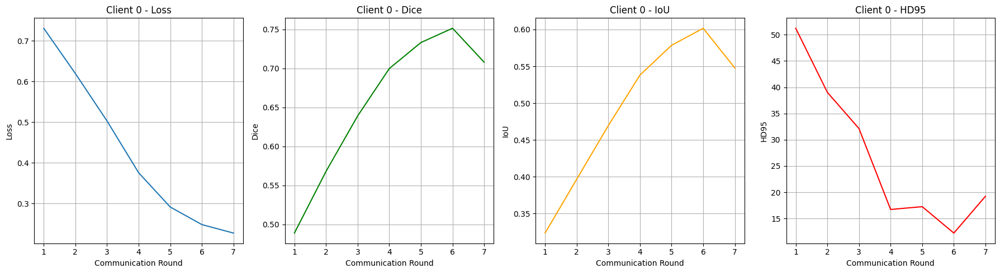

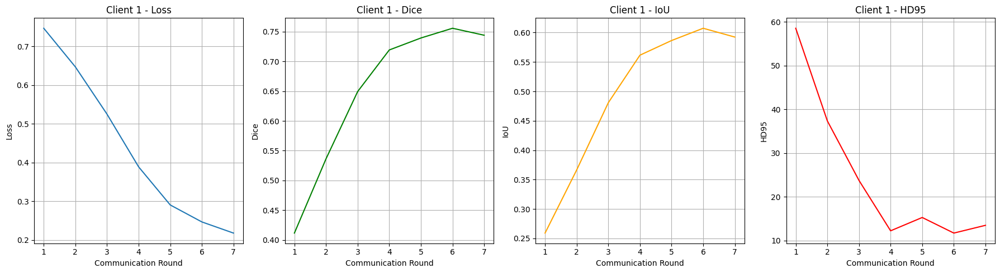

In [58]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

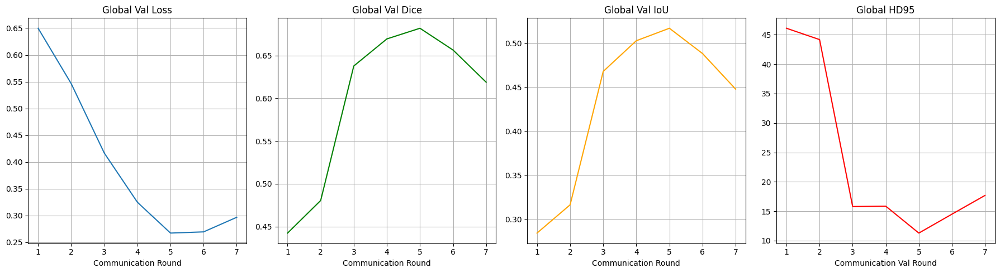

In [59]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [60]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test samples: 29
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing: 100%|██████████| 29/29 [00:06<00:00,  4.25it/s, Dice=0.6916, IoU=0.5285, HD95=18.6065]


Test Set Metrics:
Dice: 0.6916
IoU: 0.5285
HD95: 18.6065


**Visualize**

29


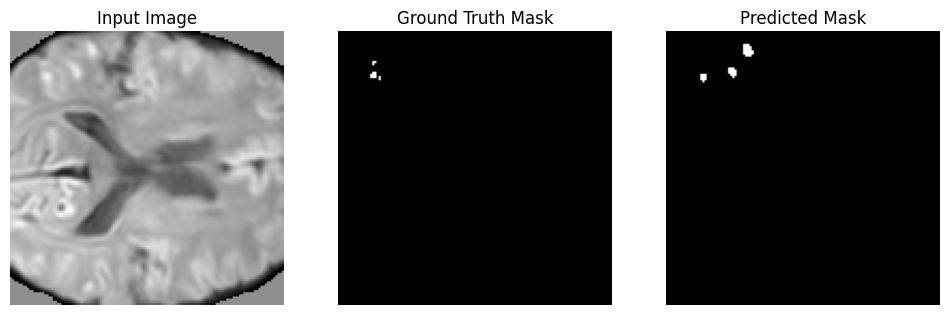

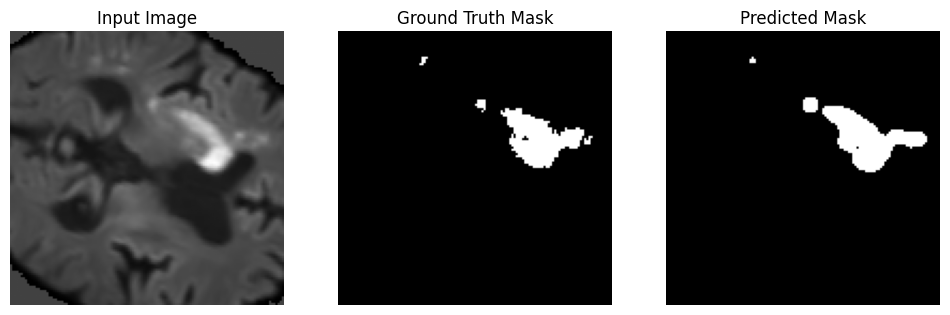

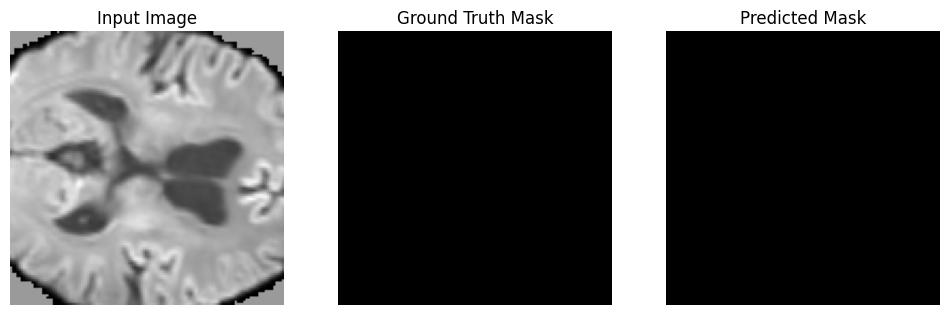

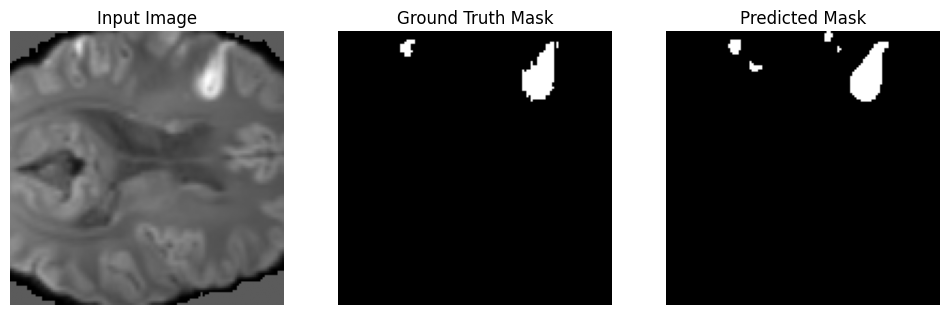

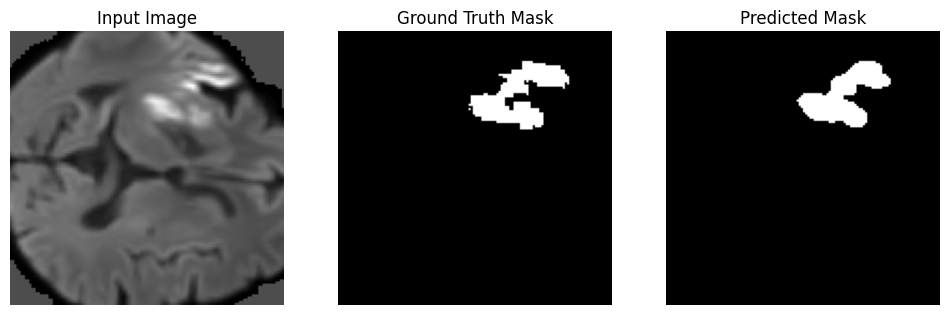

...

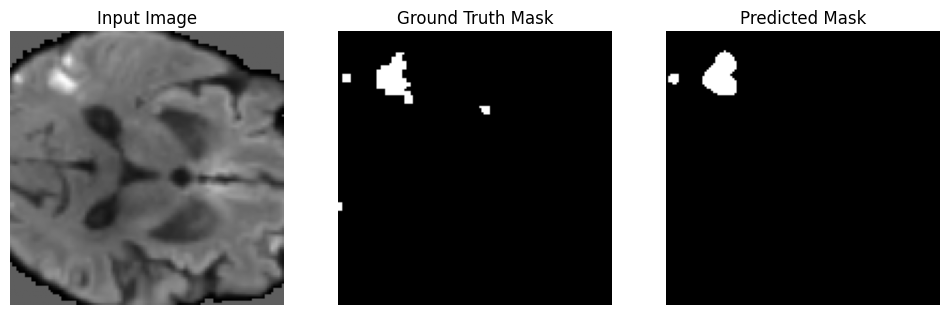

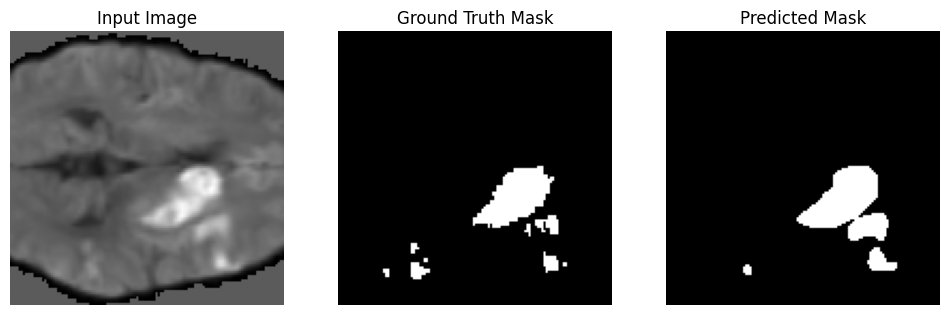

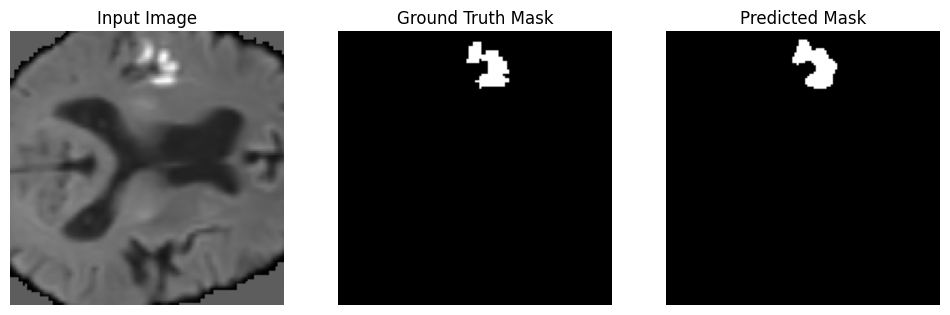

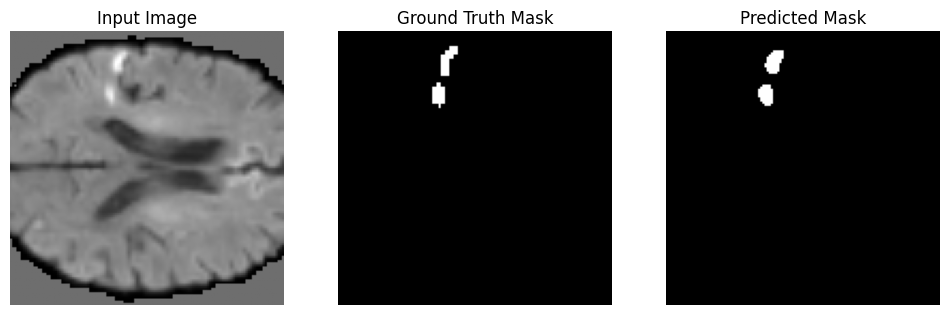

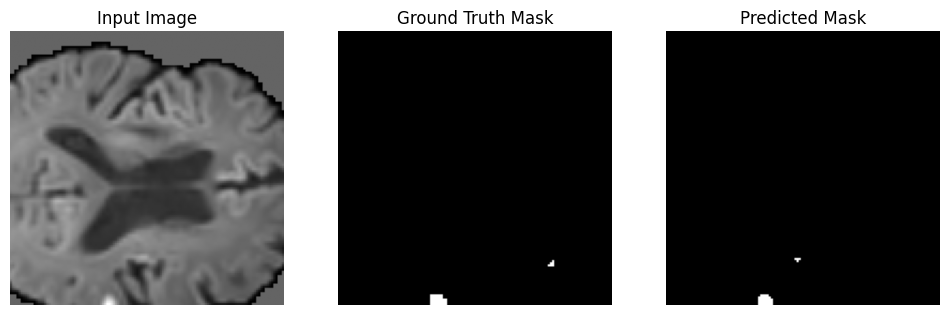

In [61]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()